# **APS1017**
#**Project 1: Demand Forecasting**

###**Submission date: 11th June 2021.**

###Submitted by:

Alan Chacko 1007532608

Asm Sajid 1007202992

Poornitha Suresh 1006575760

Mainak Das 1006590887

---


##**SUMMARY**

  This project aims to forecast the order quantity for a given list of materials for a given set of clients. The basic workflow of the project involves a well-compiled Python code to comprehensively study, analyze and visualize the dataset comprising multiple clients and materials through graphical plots. A weekly seasonality pattern was noticed among the order quantities for most clients and materials. Thus, two forecasting techniques that include seasonality have been used in this project.

  The Holt-Winters method (aka Triple Exponential Smoothening) is used as the first forecasting technique. Users can forecast any historical data which has seasonal patterns/seasonality using this technique. This method uses “statsmodel.tsa.holt winters” library, which takes data and period as input and forecasts using optimal smoothening parameters chosen using “Exponential Smoothing.”

Seasonal Autoregressive Integrated Moving Average (SARIMA) was used as a second method because this method can do direct modeling of the seasonal component of time series data forecasting. Unlike the Holt-Winters method, optimal parameters for this method are manually chosen by interpreting different parameters used in forecasting.

The code is segmented into multiple functions responsible for resampling and filtering the dataset based on different user inputs. A simple interactive main function is used to capture the user inputs, forecast the order quantity based on the given date, and plot the respective graphs. Thus, by executing the code, forecasts for any given user input can be predicted and plotted on the graph.

There are three scenarios for output depending on the user input. For instance, given the forecast date, the result can be for one client and one material, one client and all materials, and one material and call clients. The major functions present in the code are outlined, and the report also includes the user manual, which explains the step-by-step procedure to use the code.
 

---


##**USER MANUAL**

***Step 1:*** Download the submitted “***.ipynb"*** file and upload it on Google Colaboratory (https://colab.research.google.com) on any web browser. This will open the Python Notebook of the project which includes both the code and the report.

***Step 2:*** Different sections of the code can either be run individually or altogether sequentially from the top by using the tab “Runtime” or “Ctrl+F9” on keyboard.

*N.B. Due to numerous graphs, running the entire notebook code could result in a long runtime.*

***Step 3:*** At the end of the notebook, running the main function prompts the 3 different user inputs – ***Date***, ***Material Code*** and ***Client Number***. 

***Date*** is the first and mandatory user input which should be any date after the last datapoint mentioned in the dataset, otherwise there might be complexities faced after running the code.

For the ***Material Code***, enter any of the 20 materials mentioned in the output cell after entering the ***Date*** previously. As this is an optional user input, 0 can be entered if the user does not want to specify any material.

***Client Number*** is the last and another optional user input which can be chosen from any integer between 1 and 10 or 0 if the user does not want to specify any client. 

N.B. Both ***Material Code*** and ***Client Number*** cannot be zero (0).

***Step 4:*** After entering all three inputs in Step 3, the forecast prediction and resulting plots will be displayed as outputs.

*N.B. All the sections of the code must be run sequentially starting from the first section, in order to update all variables and DataFrames.*

---

##Explanation and visualization of the data 

**Explanation of fields**

The given data consists of dates, Order quantities and two other categorical data, i.e., Client and Material. Client represents client IDs and has 10 unique values whereas Material represents material IDs and has 20 unique values. The given data consists of (2773, 4) values which may contain repeated values. We make sure to remove these duplicate values after which we obtain (2448, 4) values.
Each date has an order quantity along with client ID, material ID or both client and material IDs. If for a particular date and its order quantity, the client is not provided, prediction is made on the aggregate demand for the given material from all clients on the given future date. And if for a particular date and its order quantity, the material is not provided, prediction is made on the aggregate demand for all the materials from the given client on the given future date


**Graphs over time for each client, for each material, for each pair of client and material.**

We can see that the given data has order quantities for a client, material or both client and material over a particular date. And hence 3 different types of graphs are needed here, i.e., graphs over time for each client, for each material and for each pair of client and material. All three of which are shown in the below section. Furthermore, when either client or material values are not given, aggrigate values of the same for the given material or client values respectively are taken into consideration. Example: if client is not given, the aggregate values of all the clients for the given material is used in forecasting a future value.

---

##METHOD 1

**Triple Exponential Smoothing (Holt’s Winter Method)**

**Triple Exponential Smoothing/Holt’s Winter Method** is used when there is a **Non-Linear Seasonality**. This method uses exponential smoothing on seasonal components of a year, i.e. summer, fall, winter and spring in addition to trend and level. Even though the duration of the season may vary from one season to another, the temperature within the cycle follows a specific repetitive pattern. Hence, this method is used when the Time Series data shows no clear and obvious pattern. The seasonal factor is identified based on how the data repeats itself. Three equations included in triple exponential smoothing, with the additional parameter being seasonality of the time series and they are explained as follows:

   1)Season: Time series which repeats itself after a regular intervals, is called a seasonal time series and the interval is called a season.
    
   2)Seasonal Length: The number of data points in each season is called seasonal length. 

   3)Seasonal Component:  Seasonal component is basically an additional deviation from the series and trend which repeats every season. There is a single seasonal component for every data point in the season.
    
   a)Series: The Smoothing factor is "α" : The first equation holds true for the current time period, and is a weighted average of the current data value divided by the seasonal factor and the average from the last period adjusted for the trend for the previous period. 

  

The basic equations for Triple Exponential smoothing are given as:

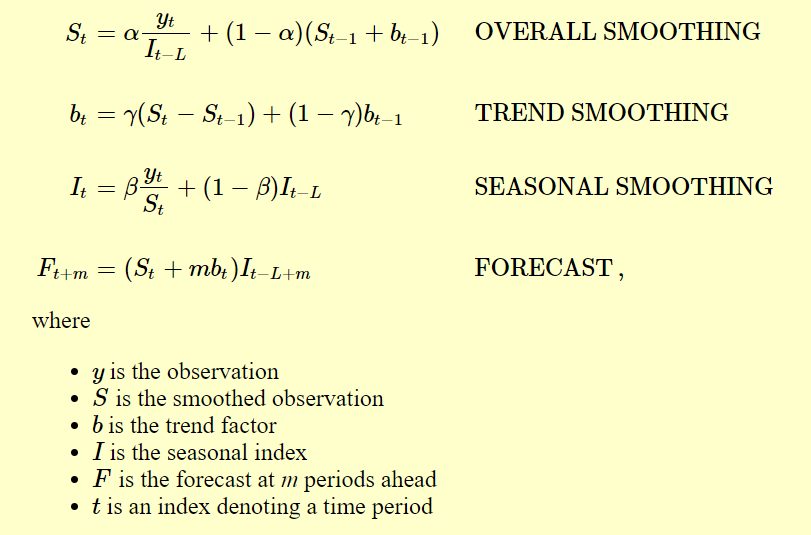

Also;

α: Smoothing factor for the Series.
β: Smoothing factor for the Trend.
γ: Smoothing factor for the seasonality; these factors should be estimated in such a way such that the MSE of the error is minimized. 
       
Reference: https://www.itl.nist.gov/div898/handbook/pmc/section4/pmc435.htm

---

  In Triple Exponential smoothing method, the time steps (period) is defined to make sure seasonality is modelled accurately and the smoothing parameters are optimally chosen by using the fit function from tsa library whereas in SARIMA method, the optimal parameters were manually chosen based on the definition of the parameters. Both the methods are implemented using the library: “Statsmodels.tsa” to keep the code concise and result in an efficient computation.

**MAJOR FUNCTIONS IN CODE**

*TriExpSmoothingdf:* This function takes the data( aggregated based on the user provided date, material ID and client ID) and period value(user provided date – last series date) and forecasts using Triple Exponential Smoothing function from statsmodels.tsa.holtwinters library

*TES_materialforecast:* This function takes the user provided date and user provided material ID as inputs. This function gets initiated when no client ID is provided. Forecast is done by aggregating  for all clients for the provided material ID

*TES_clientforecast:* This function takes the user provided date and user provided client ID as inputs. This function gets initiated when no material ID is provided. Forecast is done by aggregating  for all materials for the provided client ID

*TES_clientandmaterialforecast:* This function takes the user provided date ,user provided client ID and user provided material ID as inputs. Forecast is done based on the specific client and material ID


##METHOD 2

**SARIMA (Seasonal Autoregressive Integrated Moving Avergae)**

Seasonal Autoregressive Integrated Moving Average, also known as **SARIMA**, is a time series forecasting method developed based on ARIMA. It is an extension to ARIMA with the addition of seasonal components. Seasonal factors(seasonality) considers the data differences(variations) based on a particular period. The autoregressive part of Sarima takes into account the lag values(i.e. the past values), while the integrated part means that the new forecast will be made based on the difference from the most recent value. Moving average is the average from the past data values.

Notations for Sarima model can be shown as :

SARIMA = (p,d,q)(P,D,Q)m

Where,
     
             p is the trend order of the autoregressive(AR) part
             d is the trend order of the differencing part
             q Is the trend order of the moving average(MA) part
             P is the seasonal order of the autoregressive(AR) part
             Q is the seasonal order of the differencing part
             D Is the seasonal order of the moving average(MA) part
             m is the number of observations per year 

In the above equation, (p,d,q) is the non-seasonal section and, (P,D,Q)m is the seasonal section

For instance, in our project, our model is defined as (1,1,1)(1,1,1)7 and using the backshift notation our model can be represented as 

(1 − φ1B)(1 − Φ1B7)(1 − B)(1 − B7)yt = (1 − θ1B)(1 − Θ1B7)et

Where,        
             
             (1 − φ1B) denotes the non seasonal AR(1)  
             (1 − Φ1B7 ) denotes the Seasonal AR(1)
             (1 − B) denotes the Non seasonal difference
             (1 − B7) denotes the seasonal difference
             (1 − θ1B) denotes the non seasonal MA(1)
             (1 − Θ1B7) denotes the seasonal MA(1)

In the above equation, epsilon(e) represents the noise in the data, and the superscript of B(i.e., 7) denotes the backshift period. The first two terms above are the non seasonal and seasonal auto regressive terms, the third and fourth terms of the equation are the non seasonal and seasonal differences respectively, and the right side of the equations denotes the non seasonal and seasonal moving averages. Once the SARIMAX function is called upon and the above parameters are initialized), the model is then fitted using the fit function( an in built function in python scikit-learn), then is predicted using predict function(another built in function) using the fitted model.

Our code predicts for three different scenarios based on the users inputs. We have tested the code for the date of 2020/04/11, with a material ID of 12293768 and client ID of c1


**MAJOR FUNCTIONS IN CODE**

*sarimaudf:* This function takes the data( aggregated based on the user provided date, material ID and client ID) and period value(user provided date – last series date) and forecasts using SARIMAX function from statsmodel.tsa.statespace.sarimax library

*sarimax_materialforecast:* This function takes the user provided date and user provided material ID as inputs. This function gets initiated when no client ID is provided. Forecast is done by aggregating  for all clients for the provided material ID

*sarimax_clientforecast:* This function takes the user provided date and user provided client ID as inputs. This function gets initiated when no material ID is provided. Forecast is done by aggregating  for all materials for the provided client ID

*sarimax_clientandmaterialforecast:* This function takes the user provided date ,user provided client ID and user provided material ID as inputs. Forecast is done based on the specific client and material ID







**BUILT-IN FUNCTIONS IN CODE**

*.read_csv() :* The read_csv function reads a comma-separated values (csv) file into DataFrame.

*.unique() :* The unique function gives unique elements of an array

*.deepcopy() :* The deepcopy function makes sure that any changes made to a copy of object do not reflect in the original object.

*.plot() :* The plot function draws pints in a diagram and incerts lines from point to point.

*ExponentialSmoothing :*This function is a forecasting technique for time series data with a trend and seasonality

*SARIMAX :* This function is another technique for forecasting time series with seasonality. 

*.fit() :* The fit function adjust the eright scoring to the dfata avlues so that max iminum accuracy canbe obtained

*.predict() :* The predict function is used to make the predictions based on the fitted data. 

*.query() :* used to query the columns of a DataFrame with a boolean expression

*.set_index() :*this function sets the DataFrame index using existing columns

*.resample() :* function is used to resample time-series data. To simplify your plot which has a lot of data points, you can aggregate the data for each day

*.to_datetime() :* helps to convert string Date time into Python Date time object

*tabulate :* printing small tables without hassle



Refrences:

1. [Holt-Winters Exponential Smoothing](https://towardsdatascience.com/holt-winters-exponential-smoothing-d703072c0572)

2. [Resample or Summarize Time Series Data in Python With Pandas](https://www.earthdatascience.org/courses/use-data-open-source-python/use-time-series-data-in-python/date-time-types-in-pandas-python/resample-time-series-data-pandas-python/)

3. [SARIMA](https://machinelearningmastery.com/sarima-for-time-series-forecasting-in-python/)

4. [Time series forecast using SARIMA](http://www.diva-portal.org/smash/get/diva2:1376696/FULLTEXT01.pdf)

5. [SARIMA models](https://math.unm.edu/~lil/Stat581/9-arima.pdf/)



In [1]:
#Importing all the required libraries for Forecasting the given-data
import pandas as pd  
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from tabulate import tabulate

from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 16,10

#Calling the given-data (.csv format)
data = pd.read_csv('https://raw.githubusercontent.com/alanchacko/APS1017/main/APS1017%20Order%20data%20for%20Project.csv', parse_dates=['Date'], infer_datetime_format = True)

In [2]:
print(data.shape)
data.head(5)

(2773, 4)


,Date,Client,Order Quantity,Material
0,2020-01-27,c9,11712,12293768
1,2020-01-15,c9,6895,12246740
2,2020-01-29,c4,504,12321896
3,2019-12-18,c3,189,12042081
4,2019-12-18,c3,110,11000851


In [3]:
print("Number of years(history) in the given data:", pd.DatetimeIndex(data['Date']).year.unique())
print("\nNumber of months(history) in the given data:", pd.DatetimeIndex(data['Date']).month.unique())
print("\nNumber of unique clients in the data :", data['Client'].unique().shape[0])
print("Unique clients are :", data['Client'].unique())
print("\nNumber of unique material ID's in the data :", data['Material'].unique().shape[0])
print("Unique material ID's are :", data['Material'].unique())

Number of years(history) in the given data: Int64Index([2020, 2019], dtype='int64', name='Date')

Number of months(history) in the given data: Int64Index([1, 12, 2], dtype='int64', name='Date')

Number of unique clients in the data : 10
Unique clients are : ['c9' 'c4' 'c3' 'c2' 'c8' 'c10' 'c6' 'c5' 'c7' 'c1']

Number of unique material ID's in the data : 20
Unique material ID's are : [12293768 12246740 12321896 12042081 11000851 11000858 11001186 12322779
 12222902 12395525 12293783 12404641 12271469 12320618 12320670 12320619
 12396696 12321895 12365978 12160666]


In [4]:
#creating  copy of the main datatframe "data"
import copy
df = copy.deepcopy(data)

In [5]:
print("Shape of given data:", data.shape)

#dropping duplicates
df.drop_duplicates(keep="first",inplace=True)

print("Shape of data after removing duplicates:", df.shape)

Shape of given data: (2773, 4)
Shape of data after removing duplicates: (2448, 4)


In [6]:
#Creating a list of unique materials and clients
uniq_materials = df['Material'].unique()
uniq_clients = df['Client'].unique()

###Graphs over time for each client, for each material, for each pair of client and material.


In [7]:
plt.rcParams["figure.figsize"] = (16, 10)

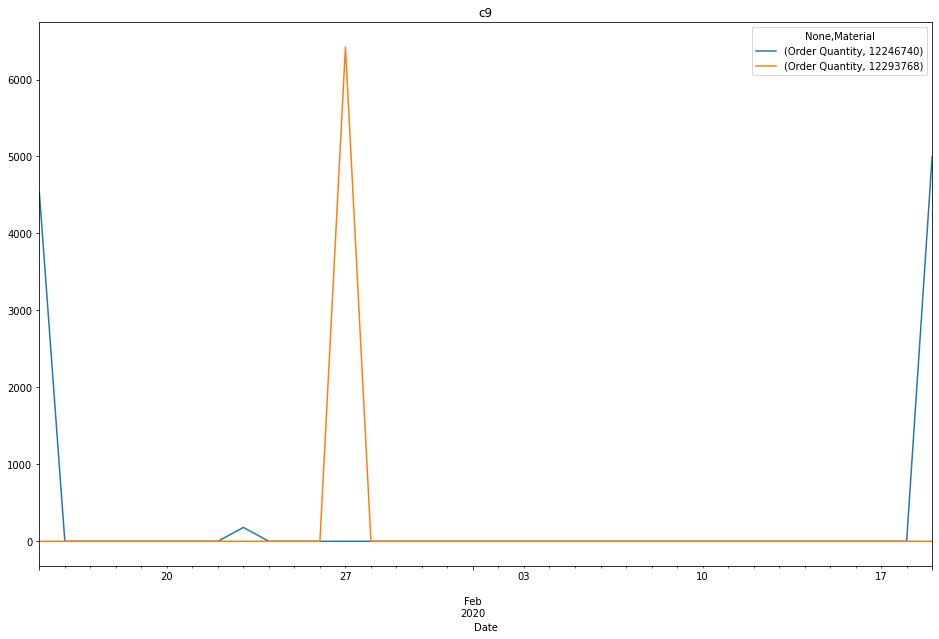

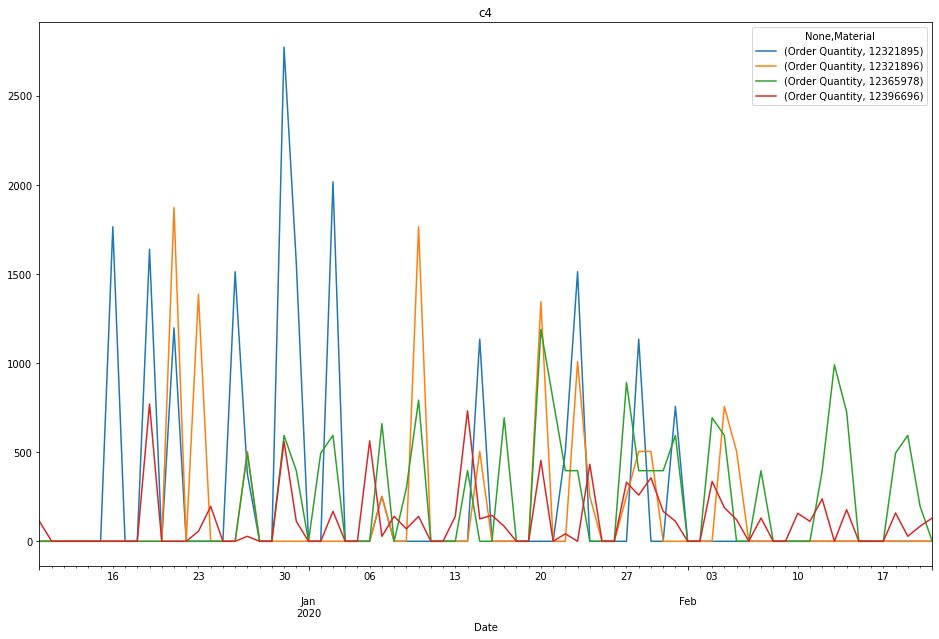

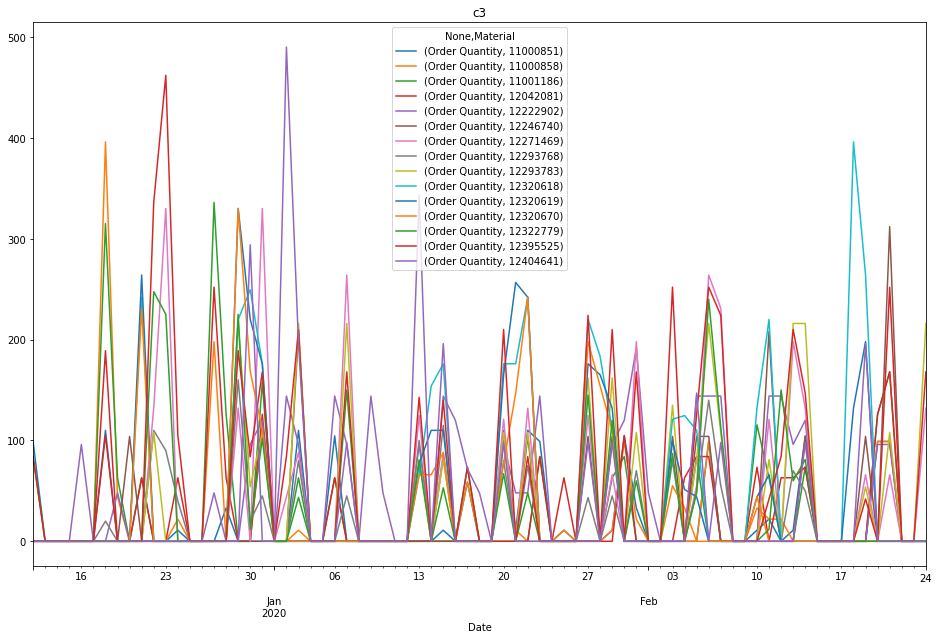

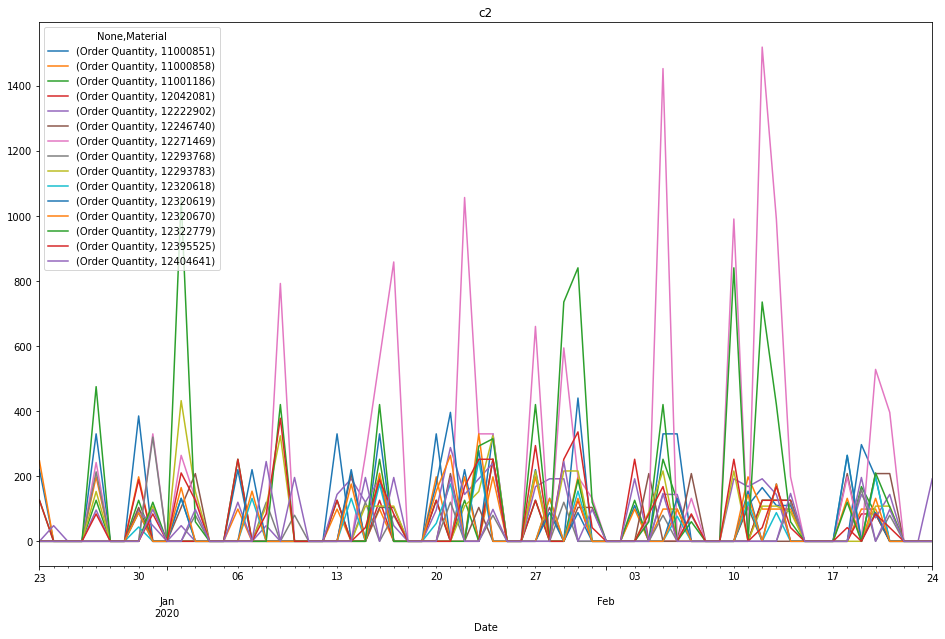

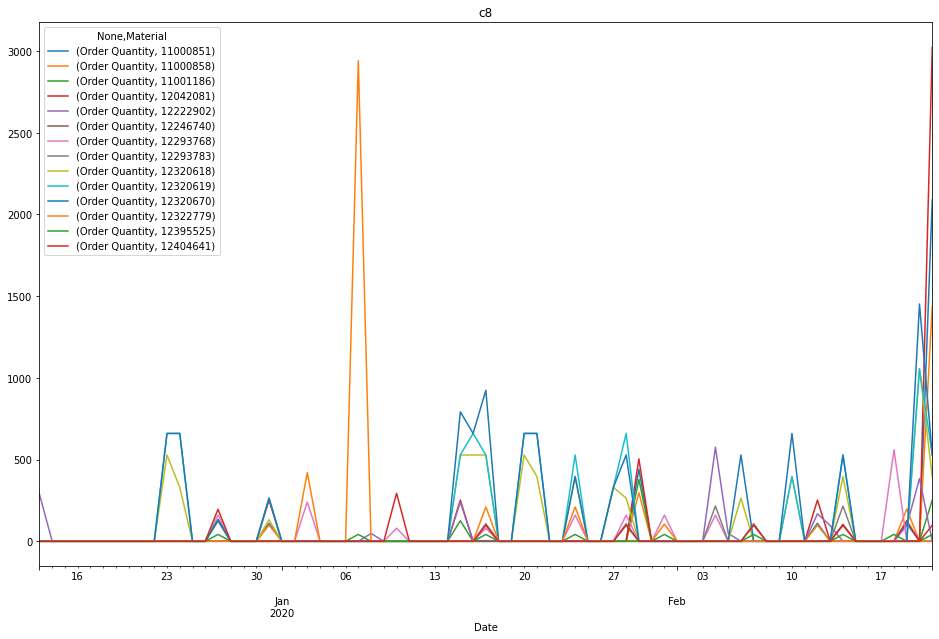

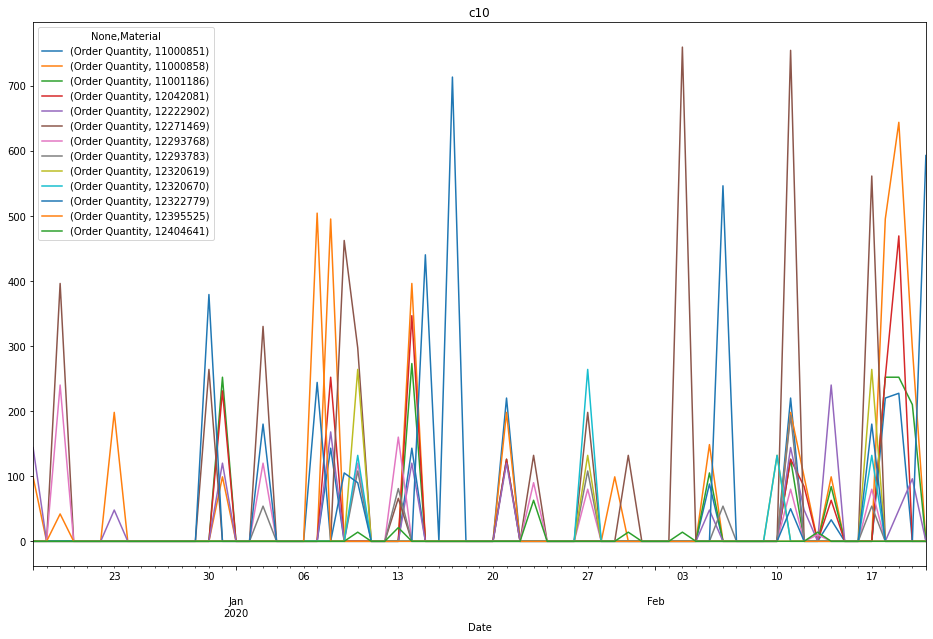

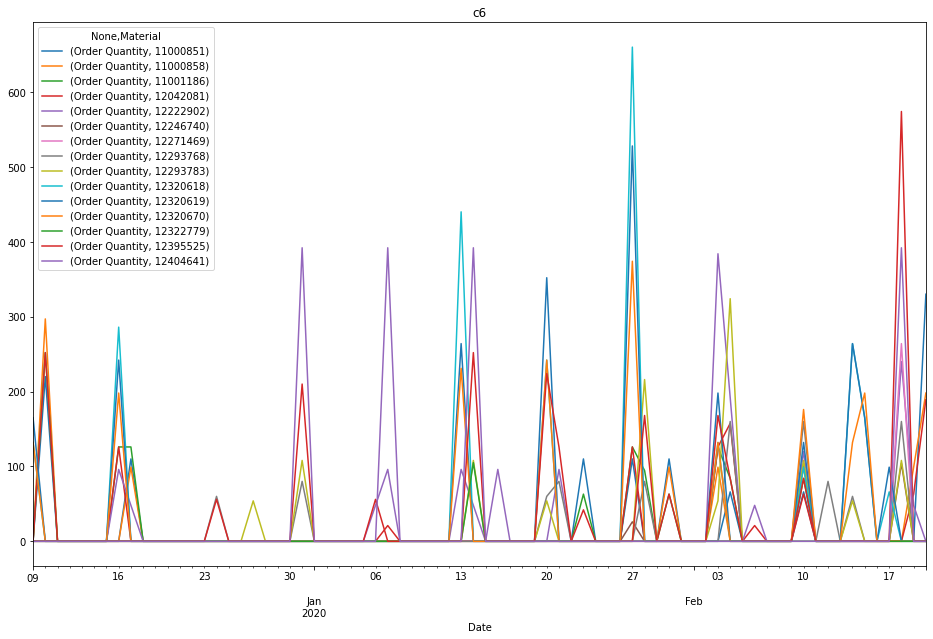

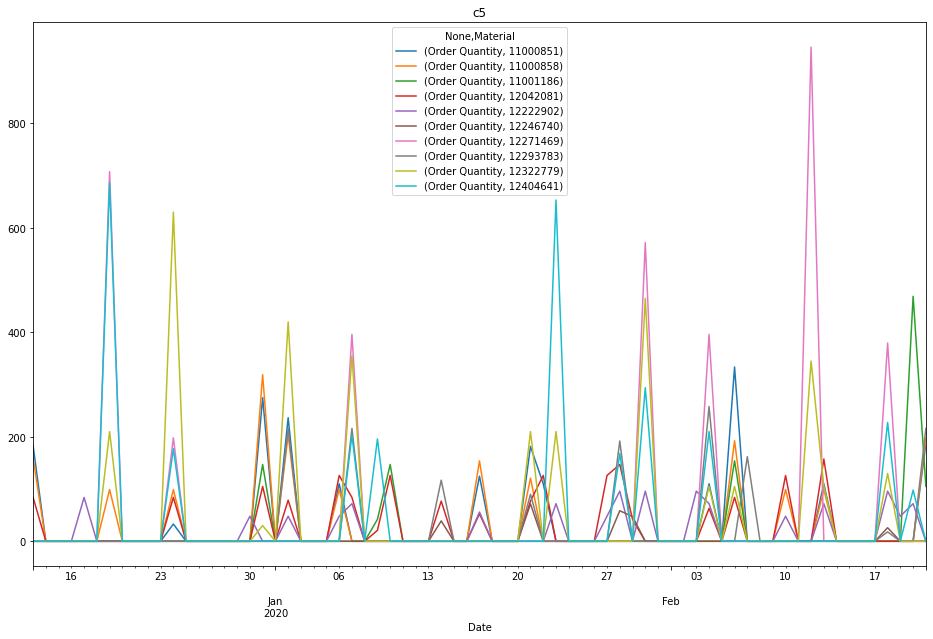

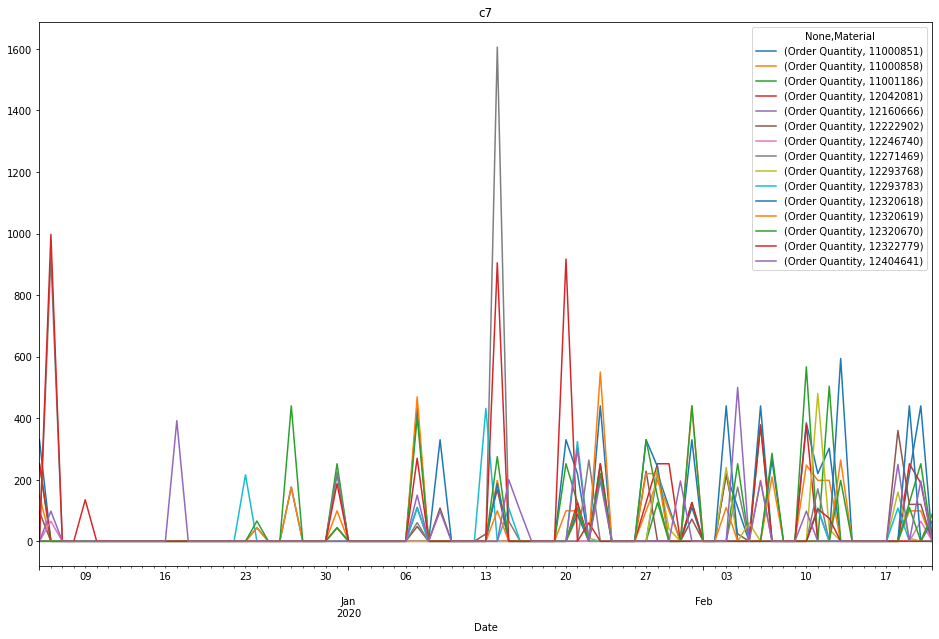

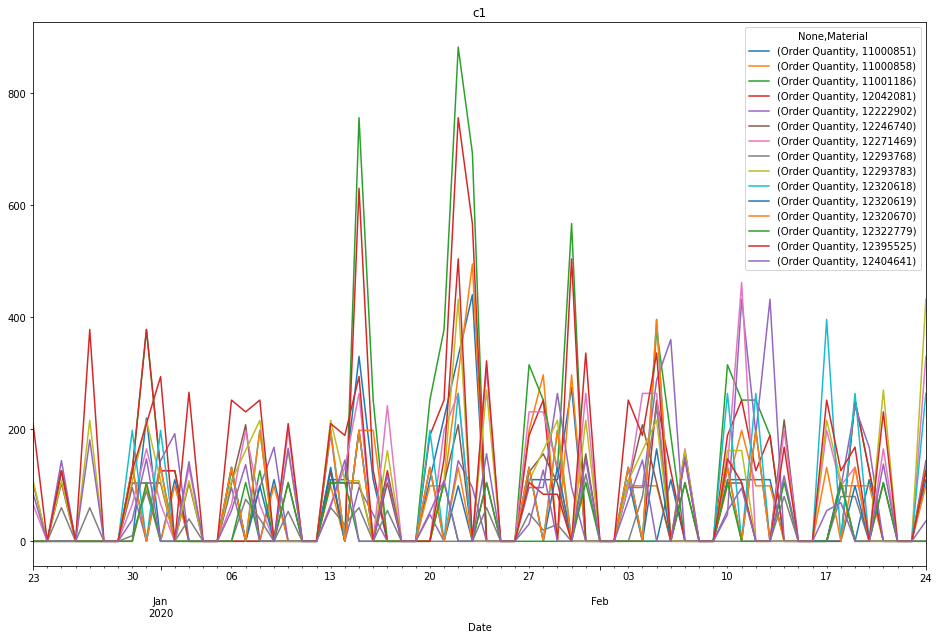

In [8]:
#Graphs over time for each client

for i in uniq_clients:
  Client_i = df.loc[df['Client'] == i]
  Client_i.drop(columns=['Client'])
  PivotedTable_C = Client_i.pivot_table(index = 'Date', columns = ['Material'])   
  PivotedTable_C = PivotedTable_C.resample('D').sum()    # Resample to daily sum of Qnt
  PivotedTable_C.plot()
  plt.title(i)

plt.show()


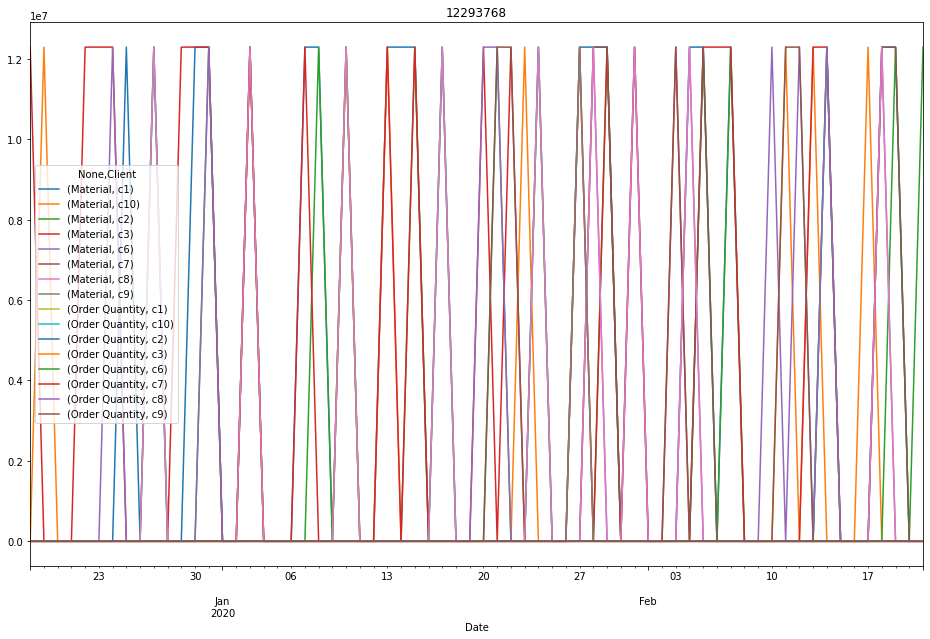

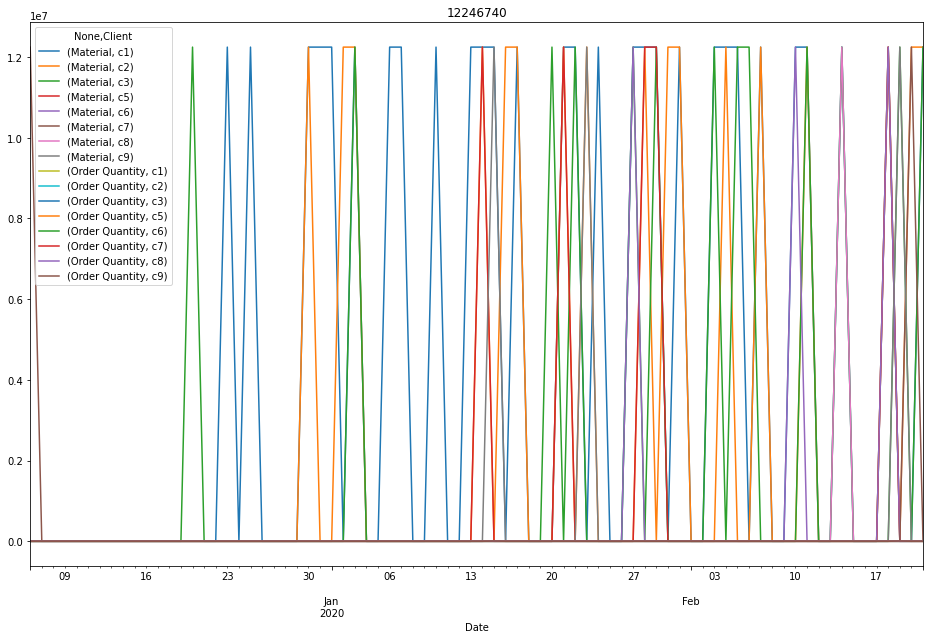

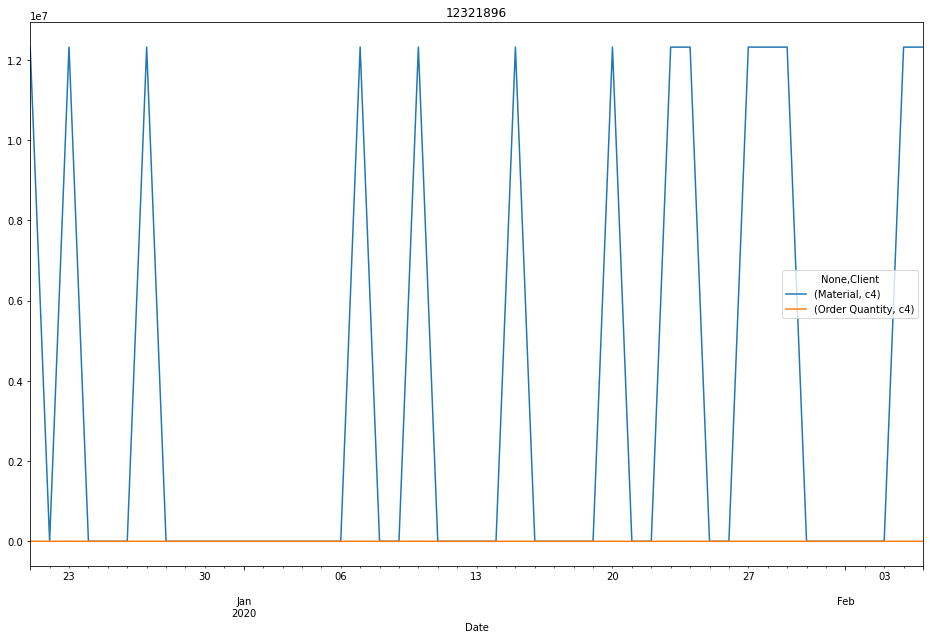

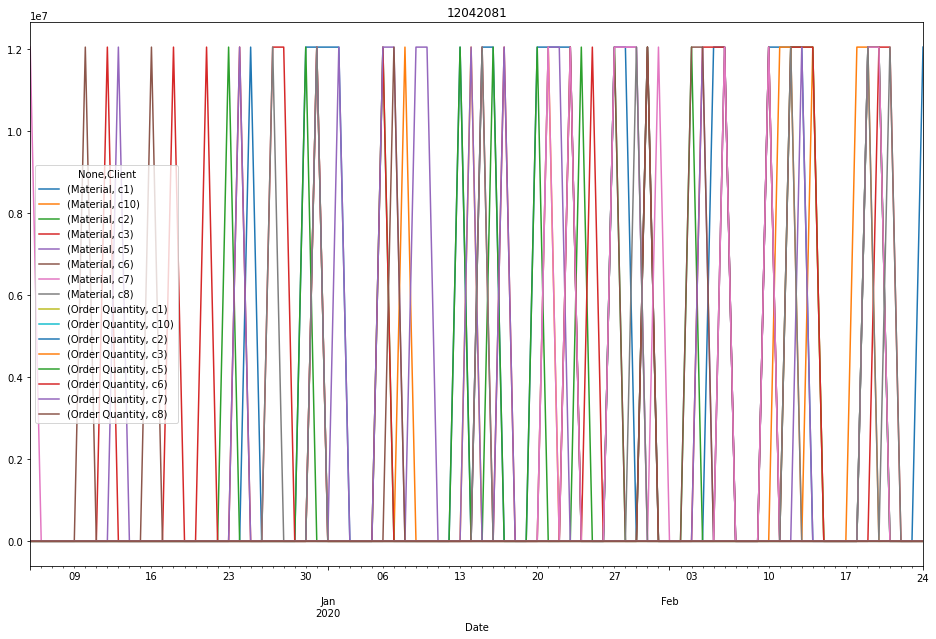

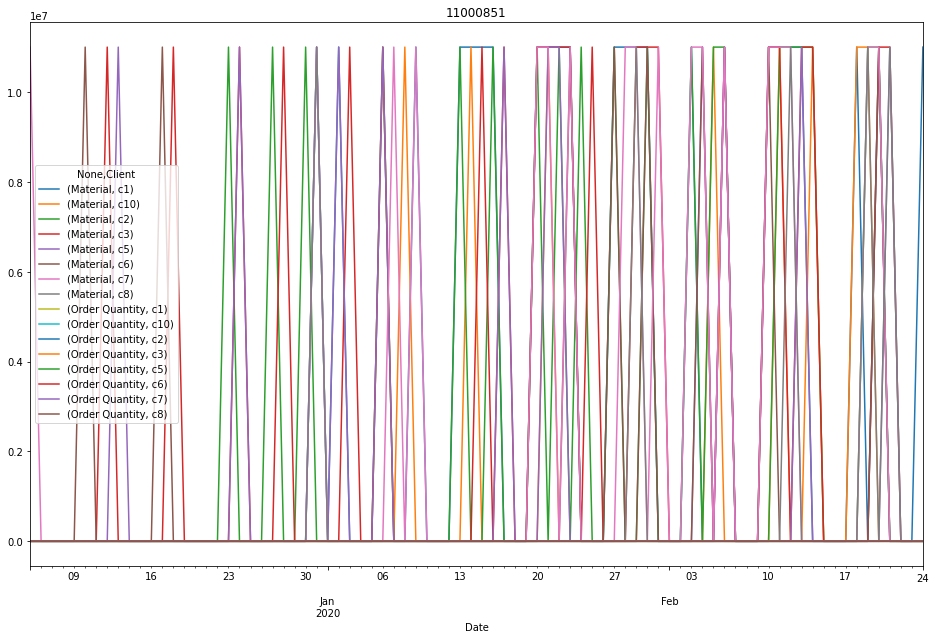

...

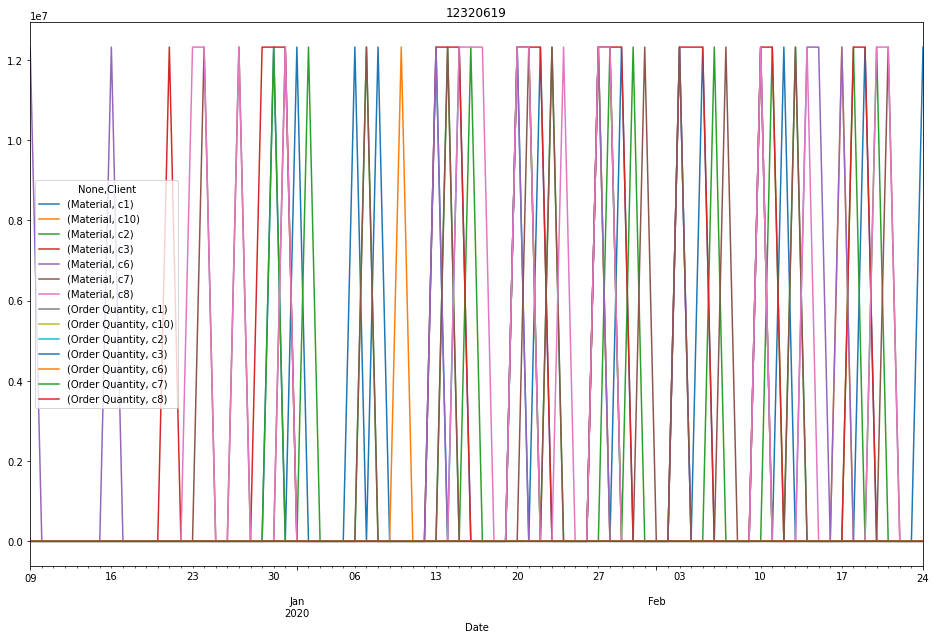

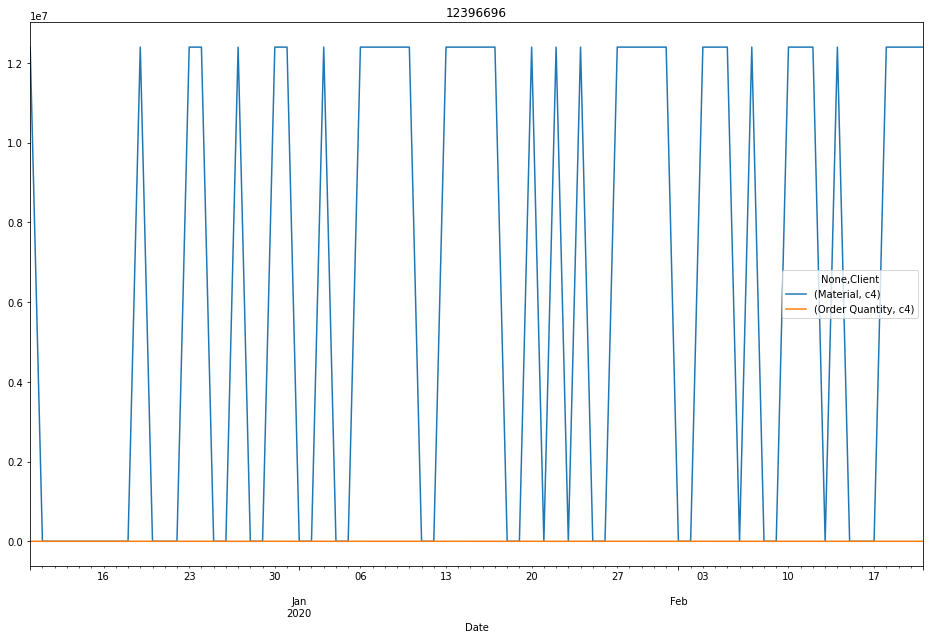

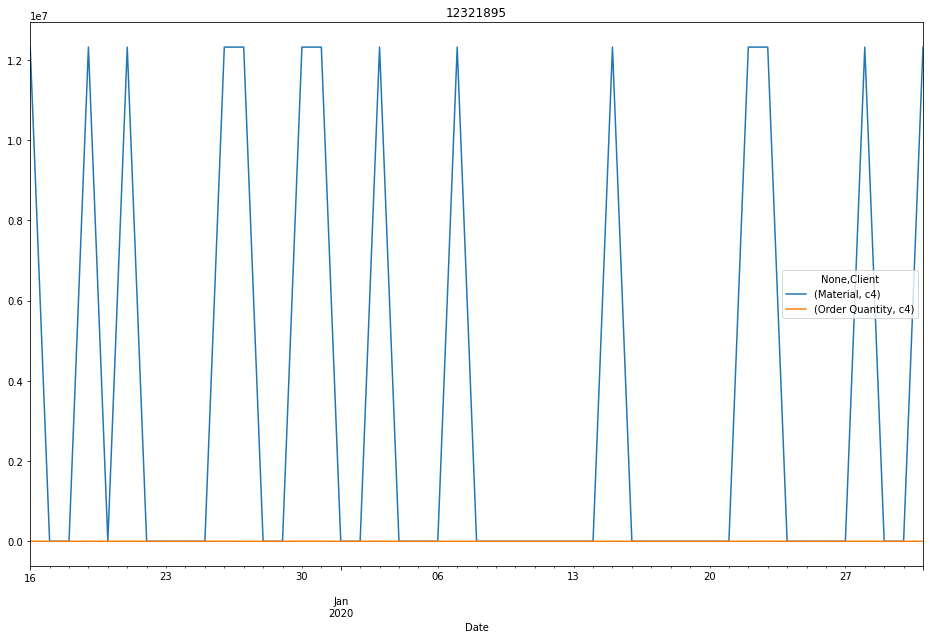

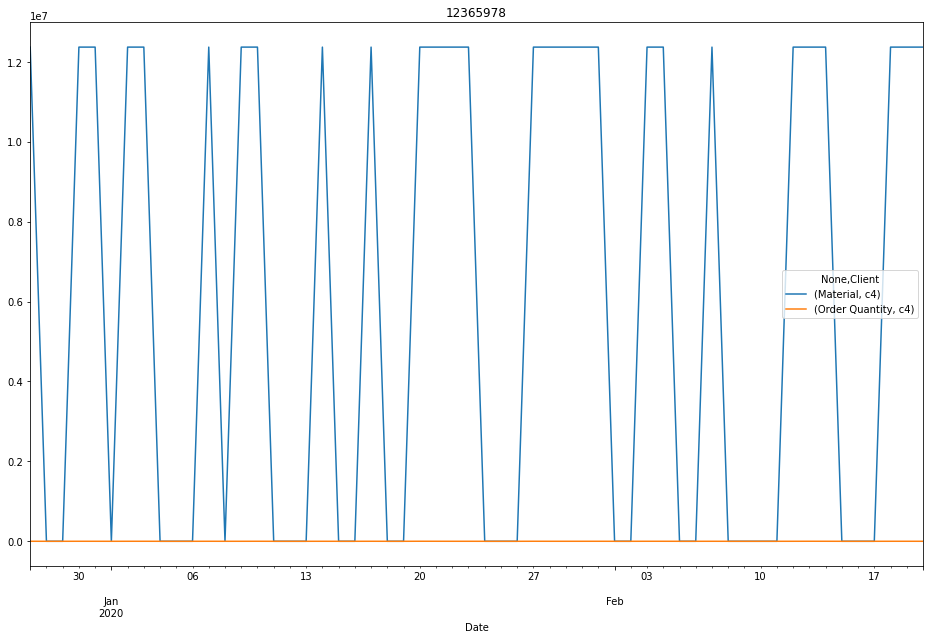

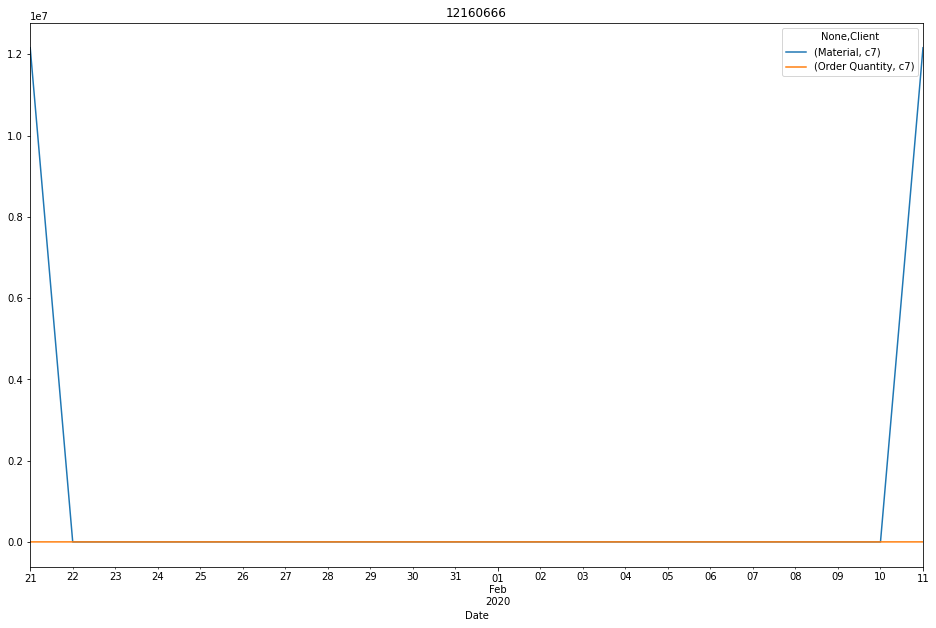

In [9]:
#Graphs over time for each material
for i in uniq_materials:
  #print(i)
  material_IDs_i = df.loc[df['Material'] == i]
  material_IDs_i.drop(columns=['Material'])
  PivotedTable_M = material_IDs_i.pivot_table(index = 'Date', columns = ['Client'])   
  PivotedTable_M = PivotedTable_M.resample('D').sum()    # Resample to daily sum of Qnt
  PivotedTable_M.plot()
  plt.title(i)

plt.show()

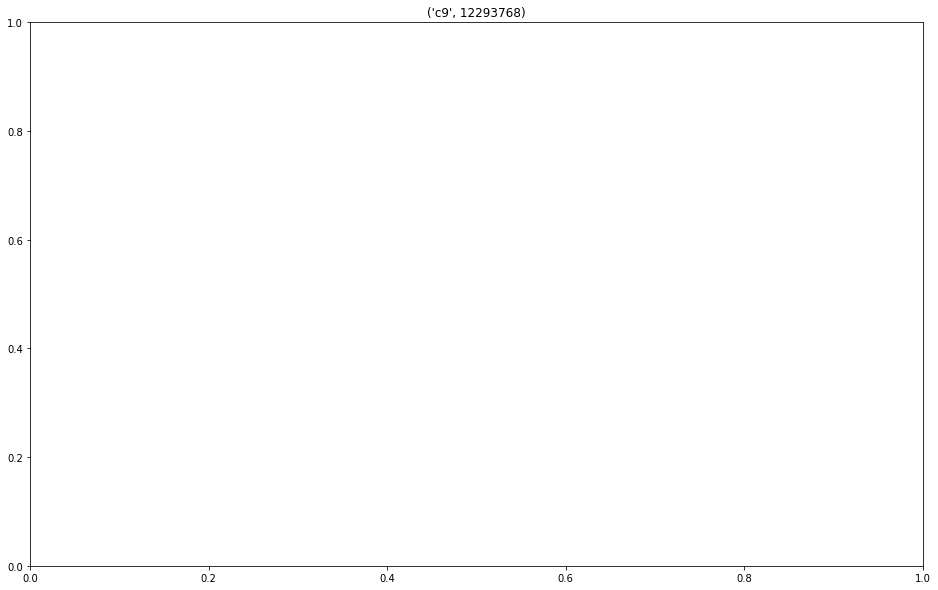

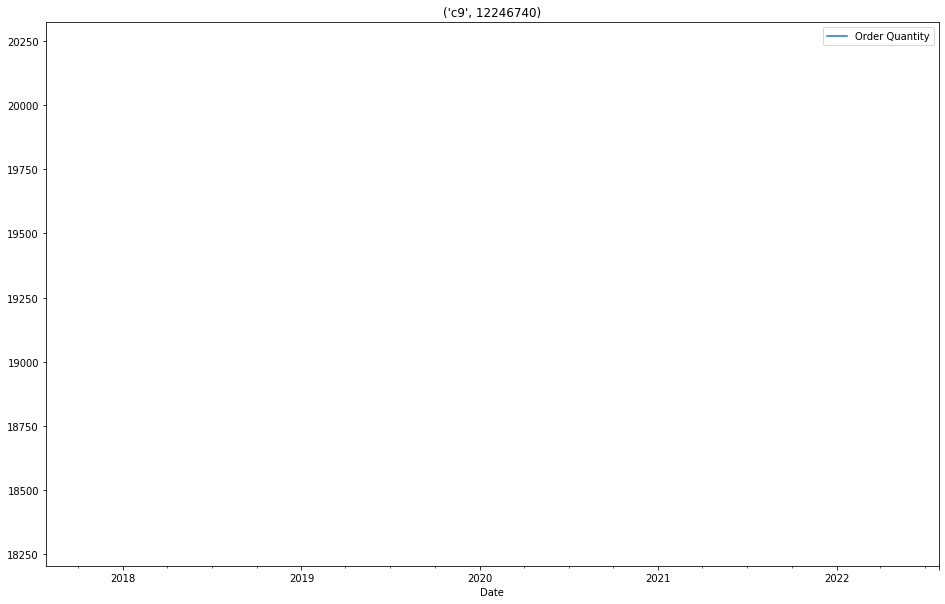

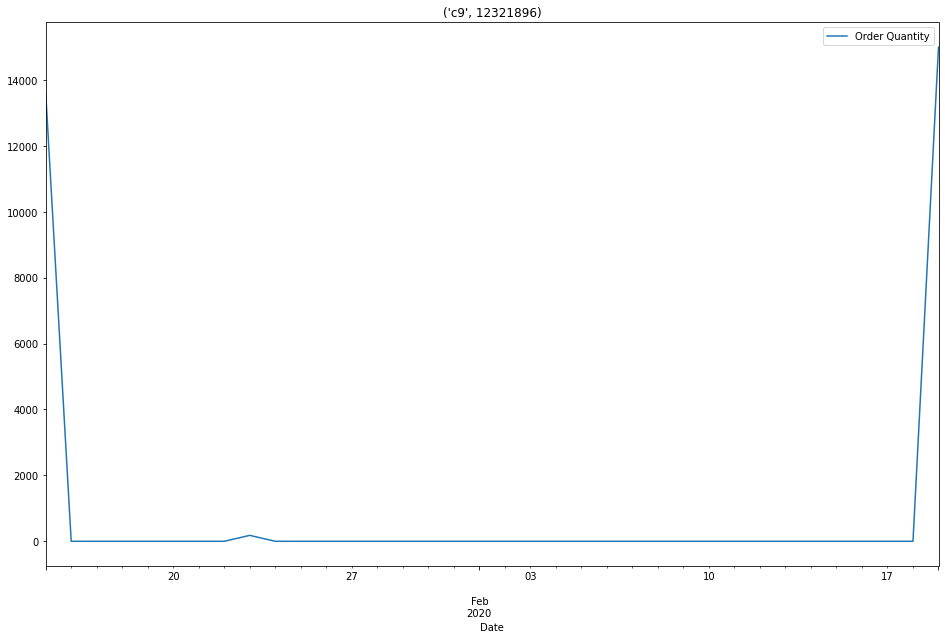

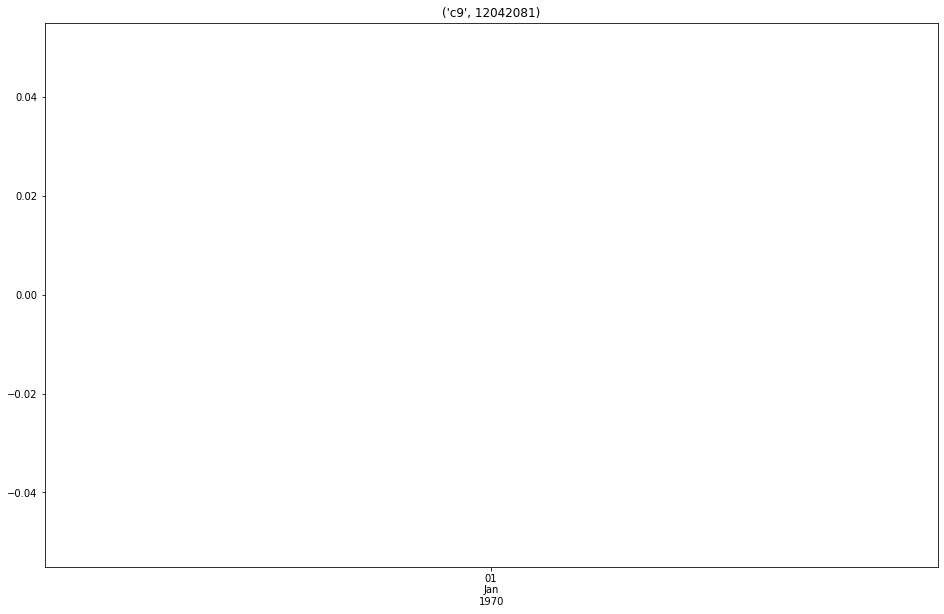

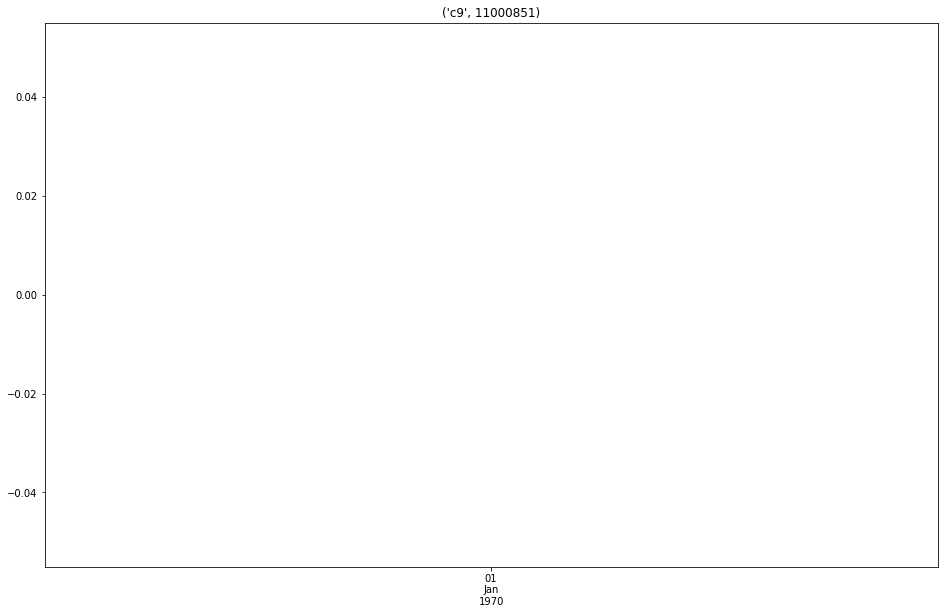

...

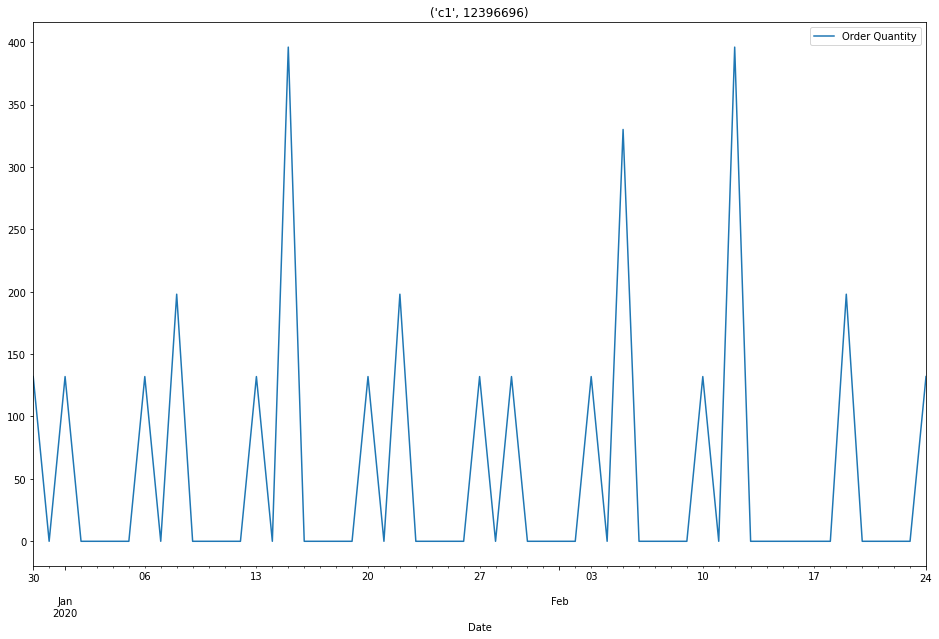

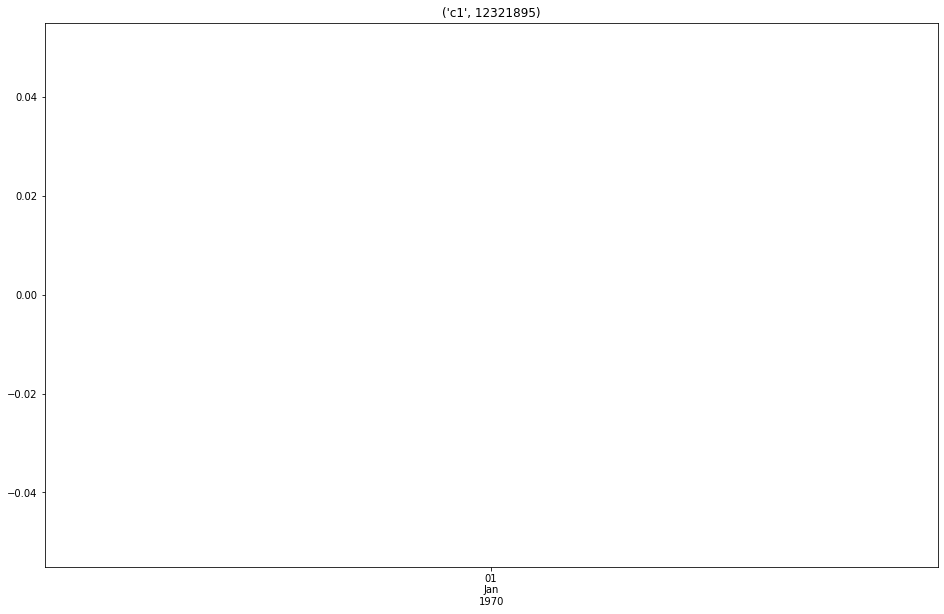

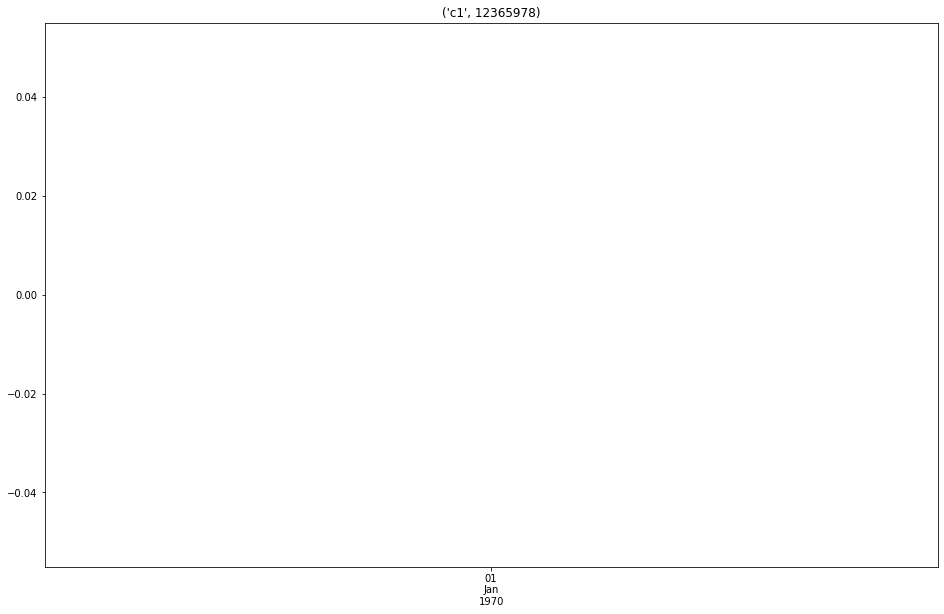

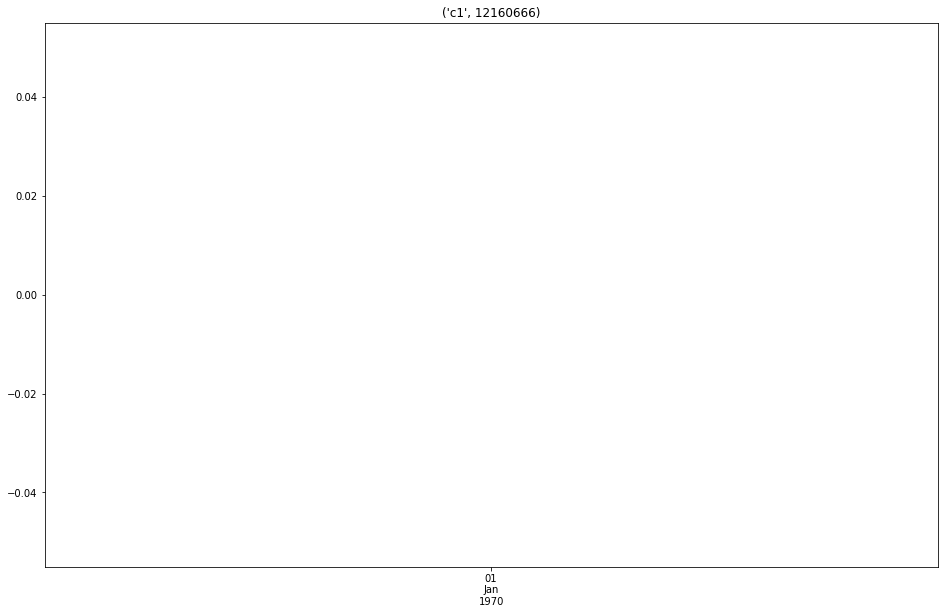

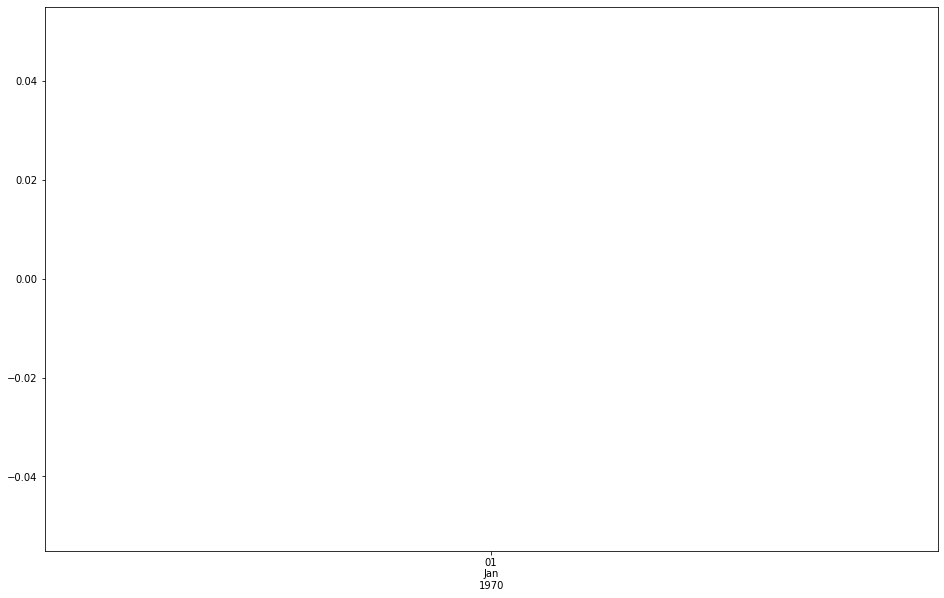

In [10]:
#Graphs over time for each client and  material

for i in uniq_clients:
  for j in uniq_materials:
    #print(i,j)
    ClientMaterial_IDs_ij = df[(df['Client'] == i) & (df['Material'] == j)]
    CnM_IDs = (i,j)
    ClientMaterial_IDs_ij = ClientMaterial_IDs_ij.drop(columns=['Client','Material'])
    ClientMaterial_IDs_ij = ClientMaterial_IDs_ij.set_index(['Date'])
    ClientMaterial_IDs_ij = ClientMaterial_IDs_ij.resample('D').sum()    # Resample to daily sum of Qnt  #https://www.earthdatascience.org/courses/use-data-open-source-python/use-time-series-data-in-python/date-time-types-in-pandas-python/resample-time-series-data-pandas-python/
    plt.title(CnM_IDs)
    try:
             ClientMaterial_IDs_ij.plot() 
    except:
       pass

plt.show()

#The blank graphs mean that the perticular material does not exist for the given client

##Methods


###Method 1: Triple Exponential Smoothing


In [11]:
def TriExpSmoothingdf(data_g,date_val):
  from statsmodels.tsa.holtwinters import ExponentialSmoothing as HWES
  #from random import random
  #import warnings
  #from statsmodels.tools.sm_exceptions import ConvergenceWarning
  #warnings.simplefilter('ignore', ConvergenceWarning)

  # fitting model
  model = HWES(data_g, seasonal_periods=7, trend='add', seasonal='add')
  fitted_model = model.fit()
  # prediction
  yhat = fitted_model.predict(len(data_g), len(data_g)+date_val-1)
  return (yhat)

In [12]:
# function to forecast when only the date and material is been provided by the user
def TES_materialforecast(gd,gm):
  md = df.query('Material == {}'.format(gm))
  md = md.set_index('Date')

  # Resample to daily frequency, aggregating multiple orders
  col = ['Order Quantity']
  sumofmaterial = md[col].resample('D').sum()
  
  lastdate = sumofmaterial.index[-1]
  gd = pd.to_datetime(gd)
  period = gd - lastdate
  period = period.days

  #calculate forecast using Triple Exponential Smoothing
  TES_forecast = TriExpSmoothingdf(sumofmaterial, period)
  import seaborn as sns
  sns.set(rc={'figure.figsize':(15, 7)})
  axes = sumofmaterial.plot()
  axes = TES_forecast.plot(label='Forecast')

  axes.set_ylabel('Order Quantity')
  axes.set_xlabel('Date and Month')
  axes.set_title('\nForecast using Triple Exponential Smoothing', fontsize = 14)

  L = axes.legend()
  L.get_texts()[0].set_text('History Data') #Setting the legend name for history data of materials
  
  return (TES_forecast)


# function to forecast when only the date and client is been provided by the user
def TES_clientforecast(gd,gc):
  client = 'c'+str(gc)
  cd = df.query('Client == "{}"'.format(client))
  cd = cd.set_index('Date')

  # Resample to daily frequency, aggregating multiple orders
  col = ['Order Quantity']
  sumofclient = cd[col].resample('D').sum()

  lastdate = sumofclient.index[-1]
  gd = pd.to_datetime(gd)
  period = gd - lastdate
  period = period.days


  #calculate forecast using Triple Exponential Smoothing
  TES_forecast = TriExpSmoothingdf(sumofclient, period)
  import seaborn as sns
  sns.set(rc={'figure.figsize':(15, 7)})
  axes = sumofclient.plot()
  axes = TES_forecast.plot(label='Forecast')

  axes.set_ylabel('Order Quantity')
  axes.set_xlabel('Date and Month')
  axes.set_title('\nForecast using Triple Exponential Smoothing', fontsize = 14)

  L = axes.legend()
  L.get_texts()[0].set_text('History Data')

  return (TES_forecast)


# function to forecast when the date, material and client is been provided by the user
def TES_clientandmaterialforecast(gd,gm,gc):
  client = 'c'+str(gc)
  md = df.query('Material == {}'.format(gm))
  cd = md.query('Client == "{}"'.format(client))
  cd = cd.set_index('Date')
  
  # Resample to daily frequency, aggregating multiple orders
  col = ['Order Quantity']
  sumofclient = cd[col].resample('D').sum()

  lastdate = sumofclient.index[-1]
  gd = pd.to_datetime(gd)
  #print(lastdate, gd)
  period = gd - lastdate
  period = period.days
  

  #calculate forecast using Triple Exponential Smoothing
  TES_forecast = TriExpSmoothingdf(sumofclient, period)
  import seaborn as sns
  sns.set(rc={'figure.figsize':(15, 7)})
  axes = sumofclient.plot()
  axes = TES_forecast.plot(label='Forecast')

  axes.set_ylabel('Order Quantity')
  axes.set_xlabel('Date and Month')
  axes.set_title('\nForecast using Triple Exponential Smoothing', fontsize = 14)

  L = axes.legend()
  L.get_texts()[0].set_text('History Data')
  
  return (TES_forecast)


###b. Method 2: SARIMAX

In [13]:
def sarimaudf(data_g,date_val):
    
  #splitting the data into train and test
  from sklearn.model_selection import train_test_split
  X_train, X_test = train_test_split(data_g, test_size=0.2, random_state=0, shuffle=False)  
  
  #fitting the model
  from statsmodels.tsa.statespace.sarimax import SARIMAX
  model = SARIMAX(data_g, order=(1, 1, 1), seasonal_order=(1, 1, 1, 7))
  model_fitted = model.fit(disp=False)

  #making prediction
  ypred = model_fitted.predict(len(data_g), len(data_g)+date_val-1)

  return (ypred)

In [14]:
# function to forecast when only the date and material is been provided by the user
def sarimax_materialforecast(gd,gm):
  md = df.query('Material == {}'.format(gm))
  md = md.set_index('Date')

  # Resample to daily frequency, aggregating multiple orders
  col = ['Order Quantity']
  sumofmaterial = md[col].resample('D').sum()
  
  lastdate = sumofmaterial.index[-1]
  gd = pd.to_datetime(gd)
  period = gd - lastdate
  period = period.days

  #calculate forecast using SARIMA
  sarimaforecast = sarimaudf(sumofmaterial, period)
  import seaborn as sns
  sns.set(rc={'figure.figsize':(15, 7)})
  axes = sumofmaterial.plot()
  axes = sarimaforecast.plot(label='Forecast')

  axes.set_ylabel('Order Quantity')
  axes.set_xlabel('Date and Month')
  axes.set_title('Forecast using SARIMA', fontsize = 14)

  L = axes.legend()
  L.get_texts()[0].set_text('History Data') #Setting the legend name for history data of materials
  
  return (sarimaforecast)

# function to forecast when only the date and client is been provided by the user
def sarimax_clientforecast(gd,gc):
  client = 'c'+str(gc)
  cd = df.query('Client == "{}"'.format(client))
  cd = cd.set_index('Date')

  # Resample to daily frequency, aggregating multiple orders
  col = ['Order Quantity']
  sumofclient = cd[col].resample('D').sum()

  lastdate = sumofclient.index[-1]
  gd = pd.to_datetime(gd)
  period = gd - lastdate
  period = period.days


  #calculate forecast using SARIMA
  sarimaforecast = sarimaudf(sumofclient, period)
  import seaborn as sns
  sns.set(rc={'figure.figsize':(15, 7)})
  axes = sumofclient.plot()
  axes = sarimaforecast.plot(label='Forecast')

  axes.set_ylabel('Order Quantity')
  axes.set_xlabel('Date and Month')
  axes.set_title('Forecast using SARIMA', fontsize = 14)

  L = axes.legend()
  L.get_texts()[0].set_text('History Data')

  return (sarimaforecast)

# function to forecast when the date, material and client is been provided by the user
def sarimax_clientandmaterialforecast(gd,gm,gc):
  client = 'c'+str(gc)
  md = df.query('Material == {}'.format(gm))
  cd = md.query('Client == "{}"'.format(client))
  cd = cd.set_index('Date')
  
  # Resample to daily frequency, aggregating multiple orders
  col = ['Order Quantity']
  sumofclient = cd[col].resample('D').sum()

  lastdate = sumofclient.index[-1]
  gd = pd.to_datetime(gd)
  #print(lastdate, gd)
  period = gd - lastdate
  period = period.days
  

  #calculate forecast using SARIMA
  sarimaforecast = sarimaudf(sumofclient, period)
  import seaborn as sns
  sns.set(rc={'figure.figsize':(15, 7)})
  axes = sumofclient.plot()
  axes = sarimaforecast.plot(label='Forecast')

  axes.set_ylabel('Order Quantity')
  axes.set_xlabel('Date and Month')
  axes.set_title('Forecast using SARIMA', fontsize = 14)

  L = axes.legend()
  L.get_texts()[0].set_text('History Data')
  
  return (sarimaforecast)



Enter the Date to be forecasted(YYYY/MM/DD) : 2020/3/24

Available codes are: 
12293768, 12246740, 12321896, 12042081, 11000851, 11000858, 11001186, 12322779, 12222902, 12395525, 12293783, 12404641,12271469, 12320618, 12320670, 12320619, 12396696, 12321895, 12365978, 12160666.
Enter 0 if you wish not to enter a material code 
Enter the material code to be forecasted: 0

Available client numbers are: 
1, 2, 3, 4, 5, 6, 7, 8, 9 
Enter 0 if you wish not to select a client 
Enter the client number between 1-10 :2


/usr/local/lib/python3.7/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)



RESULTS

|   S.no | User Date   |   User Material |   User Client | Forecast Method   |   Result |
|--------+-------------+-----------------+---------------+-------------------+----------|
|      1 | 2020/3/24   |               0 |             2 | TES               |  1514.62 |
|      2 | 2020/3/24   |               0 |             2 | SARIMA            |  1087.6  |


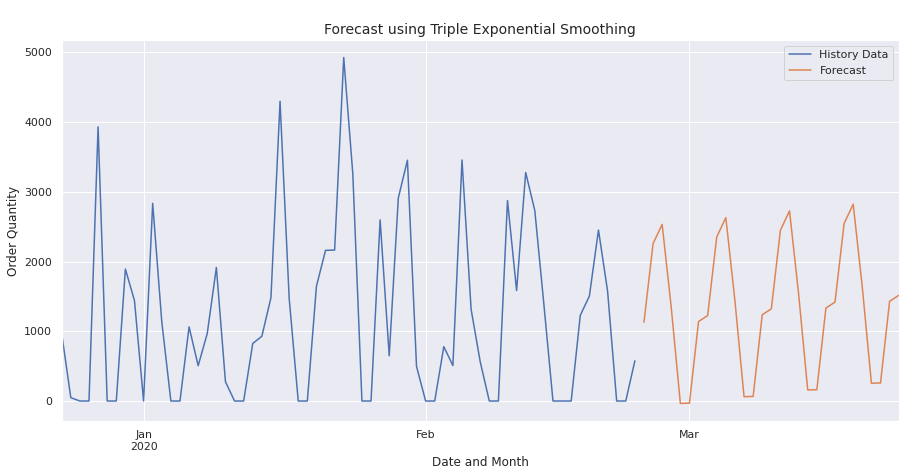

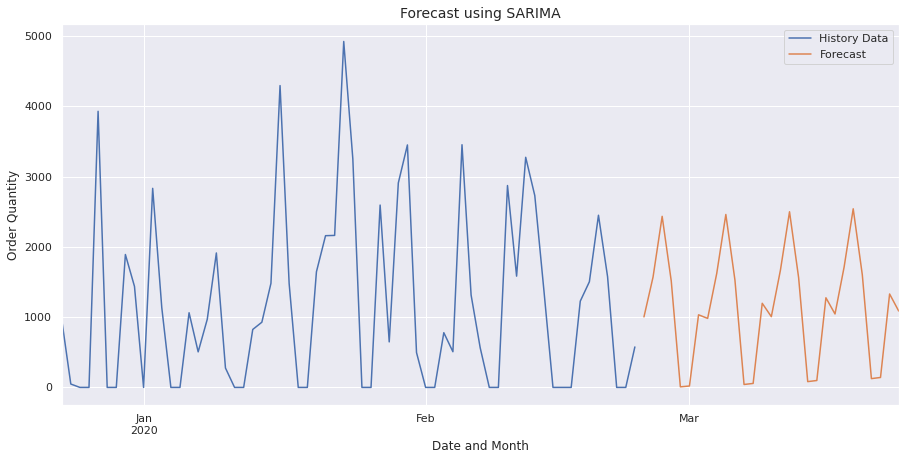

In [15]:
#Aggregating 

from tabulate import tabulate

gd = input('\n\033[1m' + 'Enter the Date to be forecasted(YYYY/MM/DD) : ' + '\033[0m')
gm = int (input('\nAvailable codes are: \n12293768, 12246740, 12321896, 12042081, 11000851, 11000858, 11001186, 12322779, 12222902, 12395525, 12293783, 12404641,12271469, 12320618, 12320670, 12320619, 12396696, 12321895, 12365978, 12160666.\nEnter 0 if you wish not to enter a material code \n\033[1m' + 'Enter the material code to be forecasted: ' + '\033[0m'))
gc = int (input('\nAvailable client numbers are: \n1, 2, 3, 4, 5, 6, 7, 8, 9 \nEnter 0 if you wish not to select a client \n\033[1m' + 'Enter the client number between 1-10 :' + '\033[0m'))

if ((gc == 0) and (gm in uniq_materials)):
  TES_forecast = TES_materialforecast(gd,gm)
  sarimaforecast = sarimax_materialforecast(gd,gm)
  # print('\n\033[4m' + '\033[1m' + 'RESULTS' + '\033[0m' + '\033[0m\nThe forecast for the given material on the date ',gd,' using Triple Exponential Smoothing is ', TES_forecast.values[-1])
  # print('\nThe forecast for the given material on the date ',gd,' using SARIMA is ', sarimaforecast.values[-1])
  print(print('\n\033[4m' + '\033[1m' + 'RESULTS' + '\033[0m' + '\033[0m\n'))
  d = [[1,gd, gm, gc, "TES", TES_forecast.values[-1]],
     [2,gd, gm, gc, "SARIMA", sarimaforecast.values[-1]]]
  print(tabulate(d, headers=['S.no', 'User Date', 'User Material', 'User Client','Forecast Method','Result'],tablefmt="orgtbl"))

elif ((gm == 0) and (gc in range(1,11,1))):
  TES_forecast = TES_clientforecast(gd,gc)
  sarimaforecast = sarimax_clientforecast(gd,gc)
  # print('\n\033[4m' + '\033[1m' + 'RESULTS' + '\033[0m' + '\033[0m\nThe total order quantity (sum of all material qty) forecast for the given client on ',gd,'using Triple Exponential Smoothing is ', TES_forecast.values[-1])
  # print('\nThe total order quantity (sum of all material qty) forecast for the given client on ',gd,'using SARIMA is ', sarimaforecast.values[-1])
  print('\n\033[4m' + '\033[1m' + 'RESULTS' + '\033[0m' + '\033[0m\n')
  d = [[1,gd, gm, gc, "TES", TES_forecast.values[-1]],
     [2,gd, gm, gc, "SARIMA", sarimaforecast.values[-1]]]
  print(tabulate(d, headers=['S.no', 'User Date', 'User Material', 'User Client','Forecast Method','Result'],tablefmt="orgtbl"))  
else:
  try:
    TES_forecast = TES_clientandmaterialforecast(gd,gm,gc)
    sarimaforecast = sarimax_clientandmaterialforecast(gd,gm,gc)
    # print('\n\033[4m' + '\033[1m' + 'RESULTS' + '\033[0m' + '\033[0m\nThe forecast for the given material & client on the date ',gd,' using Triple Exponential Smoothing is ', TES_forecast.values[-1])
    # print('\nThe forecast for the given material & client on the date ',gd,' using SARIMA is ', sarimaforecast.values[-1])
    print('\n\033[4m' + '\033[1m' + 'RESULTS' + '\033[0m' + '\033[0m\n')
    d = [[1,gd, gm, gc, "TES", TES_forecast.values[-1]],
     [2,gd, gm, gc, "SARIMA", sarimaforecast.values[-1]]]
    print(tabulate(d, headers=['S.no', 'User Date', 'User Material', 'User Client','Forecast Method','Result'],tablefmt="orgtbl"))
  except:
    print('\n\033[4m' + '\033[1m' + 'RESULTS' + '\033[0m' + '\033[0m\nThe given client does not sell the given material')